# Overview

This is a python notebook to present all the model diagnostics of bayseian models used in Examining the Longitudinal Trajectory of Biopsychosocial Difficulties in Anorexia Nervosa Within a Bayesian Framework paper.

For more information on how the data was pre-processed and how the models where built please see https://github.com/WMDA/BB_data/

## Content

Section 1: Overview of notebook

Section 2: Libraries used in this note book and reading in the data/models . 

Section 3: A Heatmap Plot

Section 4: KDE and trace plots for the mixed effects models

Section 5: Diagnostic Summaries of the mixed effects models

Section 6: Autocorrelation plots

# Libraries used in this note book and reading in the data/models
Skip this section if just interested in model diagnostics

In [12]:
from functions.data_functions import save_pickle, load_pickle, load_data
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
import numpy as np
import arviz as az

In [2]:
models_summary = load_pickle('simpler_saved_models')
fitted_models = load_pickle('simpler_fitted_models')

In [3]:
pca_df = load_data('BEACON', 'pca_df')
#Define number of components to loop over
comp = ['comp_1', 'comp_2','comp_3']

#  Heatmap

This is a heatmap of all the variables in the used in the models to check for multicollinearity

<AxesSubplot: >

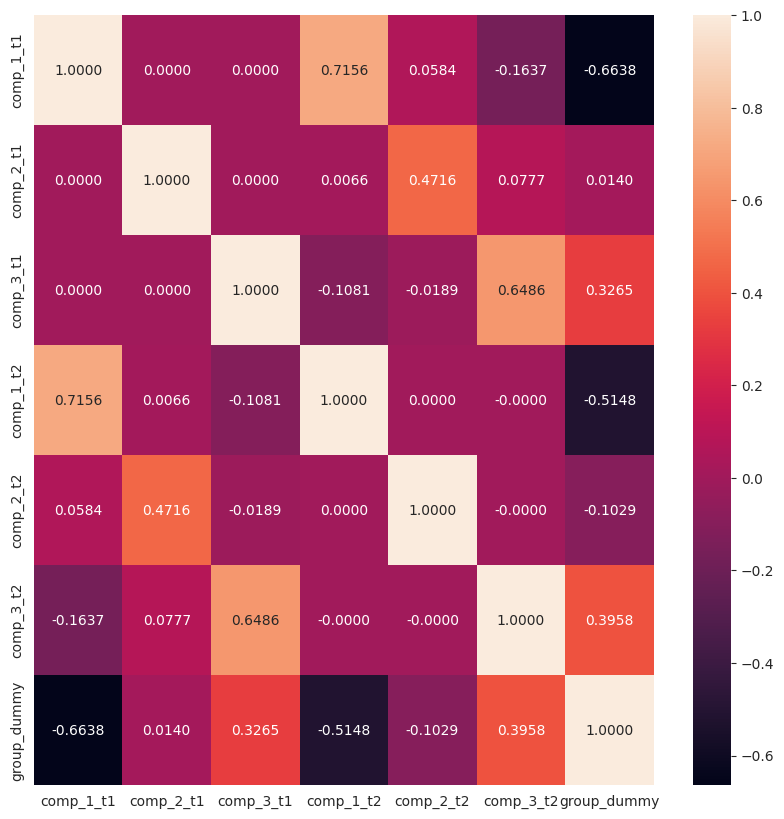

In [4]:
pca_df['group_dummy'] = pca_df['group'].apply(lambda group: 0 if group =='AN' else 1)
plt.figure(figsize=(10, 10))
sns.heatmap(pca_df[['comp_1_t1','comp_2_t1', 'comp_3_t1', 'comp_1_t2', 'comp_2_t2', 'comp_3_t2','group_dummy']].corr(),  annot=True,  fmt=".4f")

# KDE and trace plots for the mixed effects models

## Alternative hypothesis models

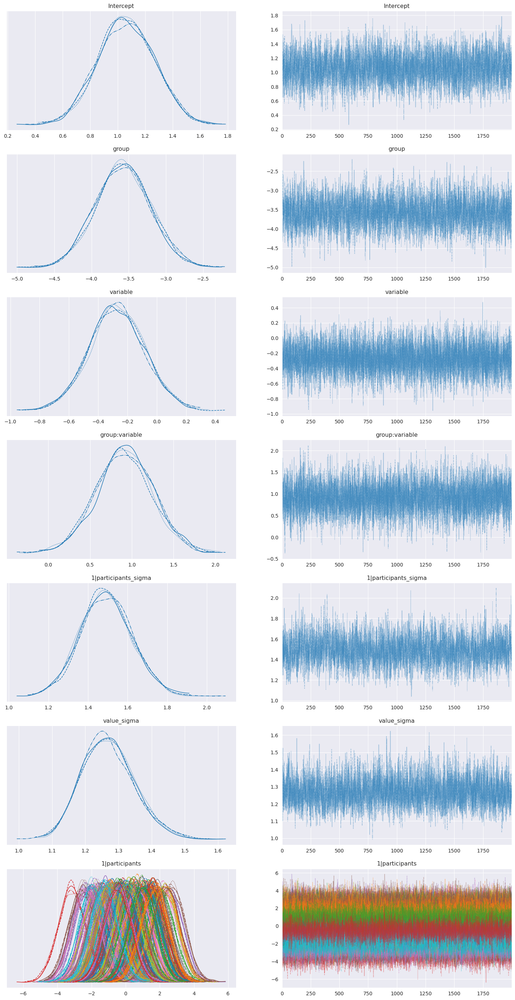

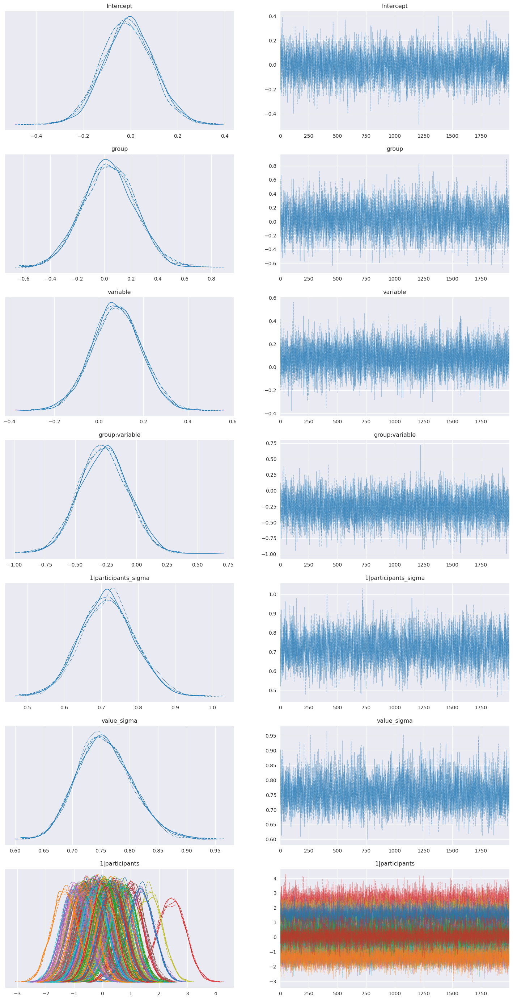

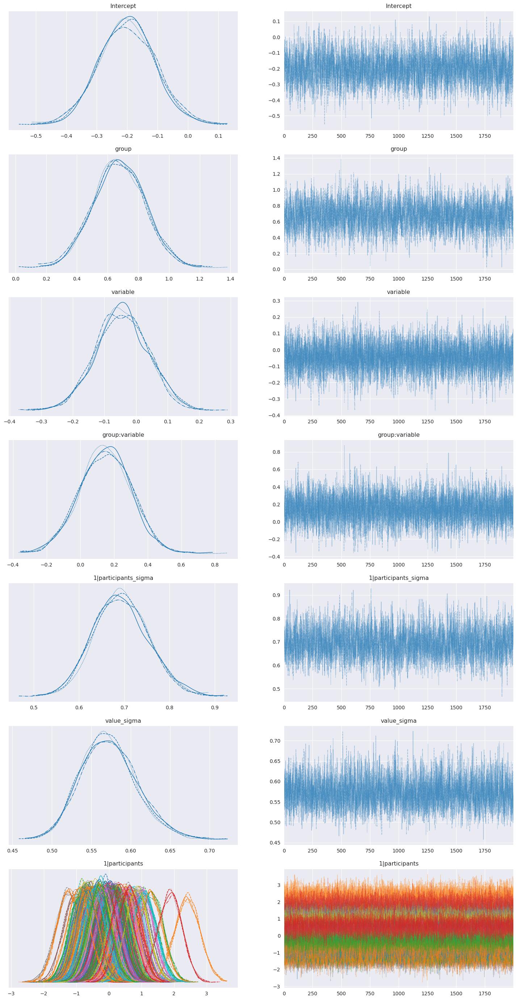

In [5]:
for component in comp:
    az.plot_trace(fitted_models['alt'][component], figsize=(18,35))

## For the null hypothesis models

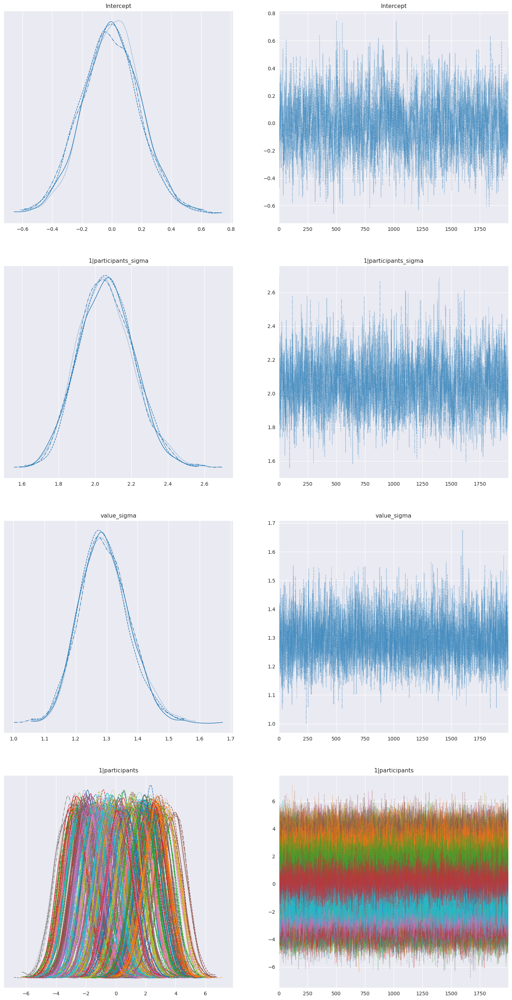

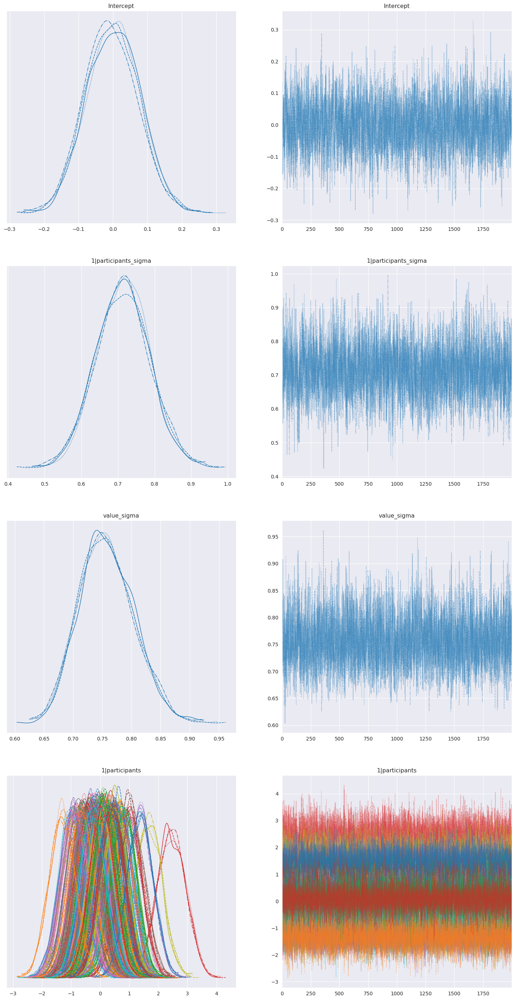

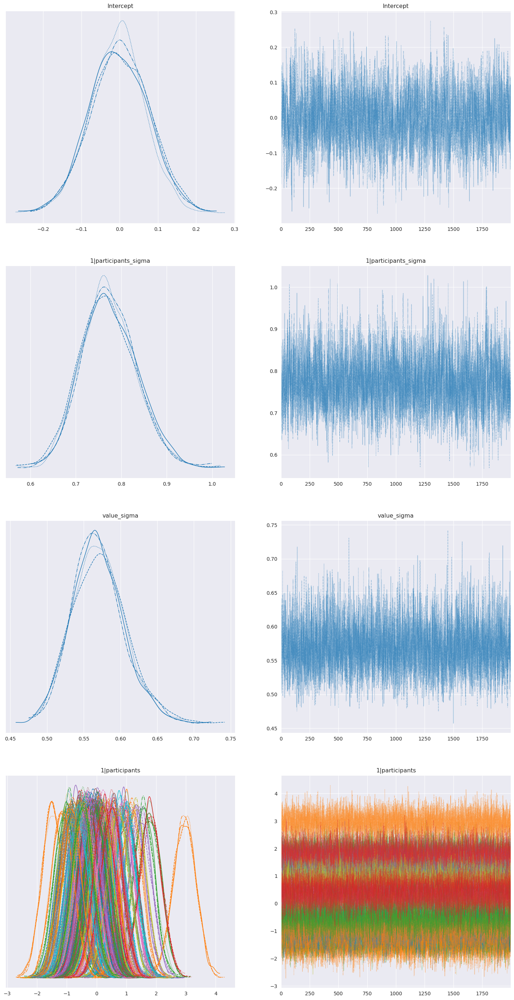

In [6]:
for component in comp:
    az.plot_trace(fitted_models['null'][component], figsize=(18,35))

# Diagnostic Summaries of the mixed effects models

## Alternative Hypothesis

In [7]:
alt_variables = ['Intercept', 'group', 'group:variable', 'value_sigma', '1|participants_sigma']
null_variables = ['value_sigma', '1|participants_sigma']

In [8]:
az.summary(fitted_models['alt']['comp_1'], kind='diagnostics', var_names=alt_variables )

,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,0.004,0.003,3194.0,4645.0,1.0
group[HC],0.006,0.005,3311.0,5059.0,1.0
"group:variable[HC, t2]",0.004,0.003,6509.0,5701.0,1.0
value_sigma,0.002,0.001,2697.0,4278.0,1.0
1|participants_sigma,0.003,0.002,2101.0,3993.0,1.0


In [9]:
az.summary(fitted_models['alt']['comp_2'], kind='diagnostics', var_names=alt_variables)

,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,0.002,0.001,2852.0,4230.0,1.0
group[HC],0.004,0.003,2847.0,4499.0,1.0
"group:variable[HC, t2]",0.003,0.002,5177.0,6231.0,1.0
value_sigma,0.001,0.001,2708.0,4788.0,1.0
1|participants_sigma,0.002,0.001,2341.0,4528.0,1.0


In [10]:
az.summary(fitted_models['alt']['comp_3'], kind='diagnostics', var_names=alt_variables)

,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,0.002,0.001,2229.0,3852.0,1.0
group[HC],0.003,0.002,2557.0,3974.0,1.0
"group:variable[HC, t2]",0.002,0.002,5459.0,5436.0,1.0
value_sigma,0.001,0.000,2866.0,5044.0,1.0
1|participants_sigma,0.001,0.001,2333.0,4097.0,1.0


Extracting the number of divergences, tree depth, energy steps and acceptance rate.

In [13]:
for component in comp:
    print(f'Number of divergences for {component} alt model:', int(np.sum(fitted_models['alt'][component].sample_stats.diverging)))
    print(f'Number of times tree depth hit 10 for {component} alt model:', int(np.sum(fitted_models['alt'][component].sample_stats.tree_depth == 10)))
    print(f'Number of energy steps > 0.3 for {component} alt model:', int(np.sum(fitted_models['alt'][component].sample_stats.energy < 0.3)))
    print(f'Number of steps where acceptance rate < 0.95 for {component} alt model:', int(np.sum(fitted_models['alt'][component].sample_stats.acceptance_rate < 0.95)))
    print('\n\n')

Number of divergences for comp_1 alt model: 0
Number of times tree depth hit 10 for comp_1 alt model: 0
Number of energy steps > 0.3 for comp_1 alt model: 0
Number of steps where acceptance rate < 0.95 for comp_1 alt model: 3074



Number of divergences for comp_2 alt model: 0
Number of times tree depth hit 10 for comp_2 alt model: 0
Number of energy steps > 0.3 for comp_2 alt model: 0
Number of steps where acceptance rate < 0.95 for comp_2 alt model: 3213



Number of divergences for comp_3 alt model: 0
Number of times tree depth hit 10 for comp_3 alt model: 0
Number of energy steps > 0.3 for comp_3 alt model: 0
Number of steps where acceptance rate < 0.95 for comp_3 alt model: 3186





## Null Hypothesis

In [14]:
az.summary(fitted_models['null']['comp_1'], kind='diagnostics', var_names=null_variables)

,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
value_sigma,0.001,0.001,3209.0,4753.0,1.0
1|participants_sigma,0.004,0.003,1427.0,2394.0,1.0


In [15]:
az.summary(fitted_models['null']['comp_2'], kind='diagnostics', var_names=null_variables)

,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
value_sigma,0.001,0.001,2821.0,4512.0,1.0
1|participants_sigma,0.002,0.001,2411.0,4181.0,1.0


In [16]:
az.summary(fitted_models['null']['comp_3'], kind='diagnostics', var_names=null_variables)

,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
value_sigma,0.001,0.000,3160.0,4755.0,1.0
1|participants_sigma,0.001,0.001,2353.0,4323.0,1.0


Extracting the number of divergences, tree depth, energy steps and acceptance rate.

In [17]:
for component in comp:
    print(f'Number of divergences for {component} alt model:', int(np.sum(fitted_models['null'][component].sample_stats.diverging)))
    print(f'Number of times tree depth hit 10 for {component} alt model:', int(np.sum(fitted_models['null'][component].sample_stats.tree_depth == 10)))
    print(f'Number of energy steps > 0.3 for {component} alt model:', int(np.sum(fitted_models['null'][component].sample_stats.energy < 0.3)))
    print(f'Number of steps where acceptance rate < 0.95 for {component} alt model:', int(np.sum(fitted_models['null'][component].sample_stats.acceptance_rate < 0.95)))
    print('\n\n')

Number of divergences for comp_1 alt model: 0
Number of times tree depth hit 10 for comp_1 alt model: 0
Number of energy steps > 0.3 for comp_1 alt model: 0
Number of steps where acceptance rate < 0.95 for comp_1 alt model: 3319



Number of divergences for comp_2 alt model: 0
Number of times tree depth hit 10 for comp_2 alt model: 0
Number of energy steps > 0.3 for comp_2 alt model: 0
Number of steps where acceptance rate < 0.95 for comp_2 alt model: 3123



Number of divergences for comp_3 alt model: 0
Number of times tree depth hit 10 for comp_3 alt model: 0
Number of energy steps > 0.3 for comp_3 alt model: 0
Number of steps where acceptance rate < 0.95 for comp_3 alt model: 3150





# Autocorrelation plots

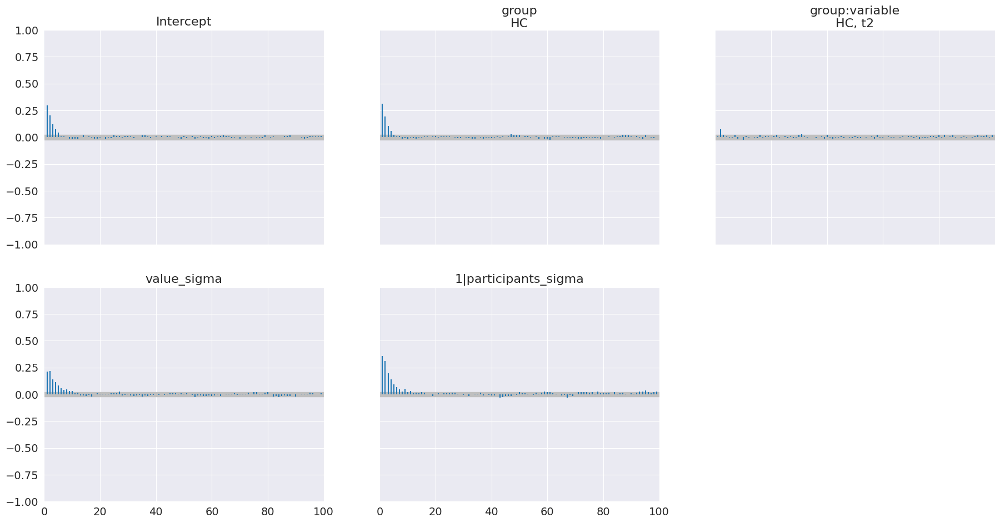

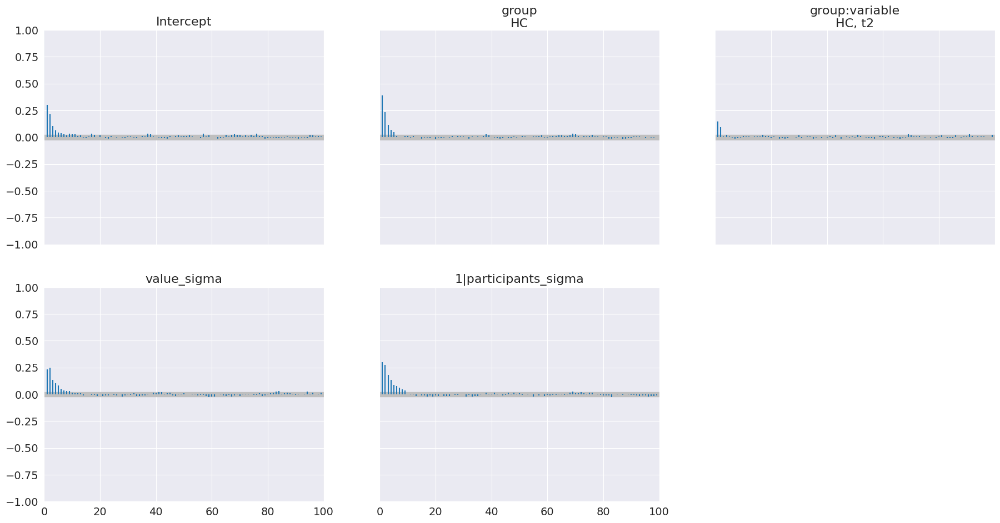

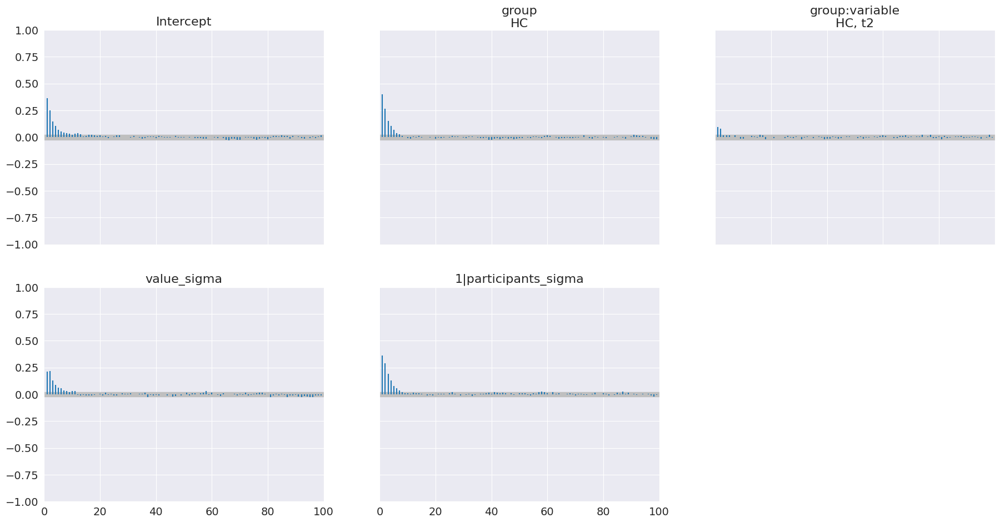

In [ ]:
for component in comp:
    az.plot_autocorr(fitted_models['alt'][component] ,combined=True, var_names=alt_variables)

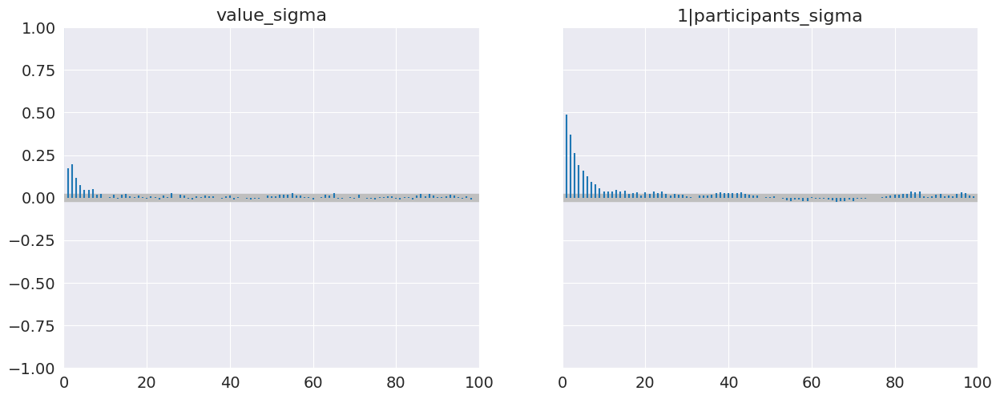

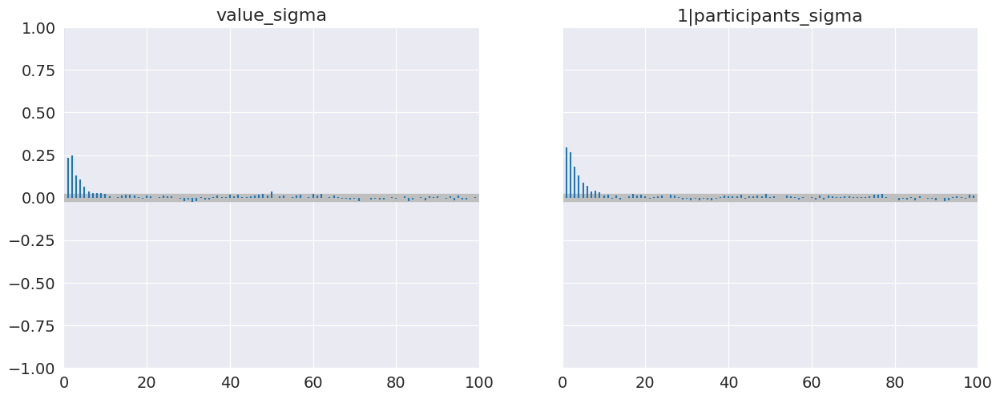

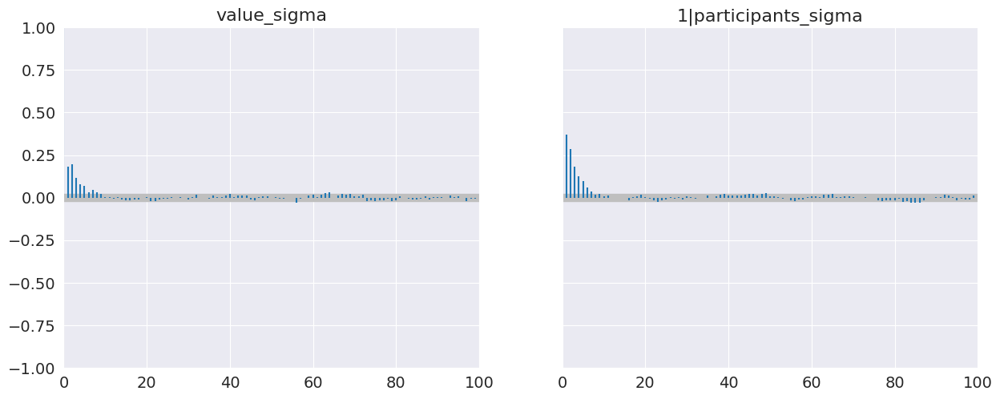

In [ ]:
for component in comp:
    az.plot_autocorr(fitted_models['null'][component] ,combined=True, var_names=null_variables)